In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import zscore
import os


In [2]:

base_path = "CMAPSSData/"
train_files = ["train_FD001.txt", "train_FD002.txt", "train_FD003.txt", "train_FD004.txt"]
test_files = ["test_FD001.txt", "test_FD002.txt", "test_FD003.txt", "test_FD004.txt"]
rul_files = ["RUL_FD001.txt", "RUL_FD002.txt", "RUL_FD003.txt", "RUL_FD004.txt"]

column_names = [
    "EngineID", "Cycle", "Op1", "Op2", "Op3",
    "Sensor1", "Sensor2", "Sensor3", "Sensor4", "Sensor5",
    "Sensor6", "Sensor7", "Sensor8", "Sensor9", "Sensor10",
    "Sensor11", "Sensor12", "Sensor13", "Sensor14", "Sensor15",
    "Sensor16", "Sensor17", "Sensor18", "Sensor19", "Sensor20",
    "Sensor21"
]

def read_files_to_dataframes(base_path, file_list, column_names=None):
    dataframes = {}
    for file_name in file_list:
        file_path = os.path.join(base_path, file_name)
        key = file_name.split('.')[0] 
        df = pd.read_csv(file_path, sep='\s+', header=None, names=column_names)
        dataframes[key] = df
    return dataframes

train_df = read_files_to_dataframes(base_path, train_files)
test_df = read_files_to_dataframes(base_path, test_files)
rul_df = read_files_to_dataframes(base_path, rul_files)

train_df["train_FD001"].head()


,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [3]:
train_df["train_FD001"].tail()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640
20630,100,200,-0.0032,-0.0005,100.0,518.67,643.85,1600.38,1432.14,14.62,...,519.30,2388.26,8137.33,8.5036,0.03,396,2388,100.0,38.37,23.0522


In [4]:
train_df["train_FD001"].describe()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,20631.00,20631.000000,20631.000000,20631.000000,2.063100e+04,...,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,518.67,642.680934,1590.523119,1408.933782,1.462000e+01,...,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705
std,29.227633,68.880990,0.002187,0.000293,0.0,0.00,0.500053,6.131150,9.000605,1.776400e-15,...,0.737553,0.071919,19.076176,0.037505,1.387812e-17,1.548763,0.0,0.0,0.180746,0.108251
min,1.000000,1.000000,-0.008700,-0.000600,100.0,518.67,641.210000,1571.040000,1382.250000,1.462000e+01,...,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,518.67,642.325000,1586.260000,1402.360000,1.462000e+01,...,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,0.000000,0.000000,100.0,518.67,642.640000,1590.100000,1408.040000,1.462000e+01,...,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,518.67,643.000000,1594.380000,1414.555000,1.462000e+01,...,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,0.008700,0.000600,100.0,518.67,644.530000,1616.910000,1441.490000,1.462000e+01,...,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


In [5]:
print("Unique Engine Count")
for key, df in train_df.items():
    unique_count = df.iloc[:, 0].nunique()
    print(f"Dataset {key}: {unique_count}")

for key, df in test_df.items():
    unique_count = df.iloc[:, 0].nunique()
    print(f"Dataset {key}: {unique_count}")

Unique Engine Count
Dataset train_FD001: 100
Dataset train_FD002: 260
Dataset train_FD003: 100
Dataset train_FD004: 249
Dataset test_FD001: 100
Dataset test_FD002: 259
Dataset test_FD003: 100
Dataset test_FD004: 248


In [ ]:
for key, df in train_df.items():
    df.columns = column_names

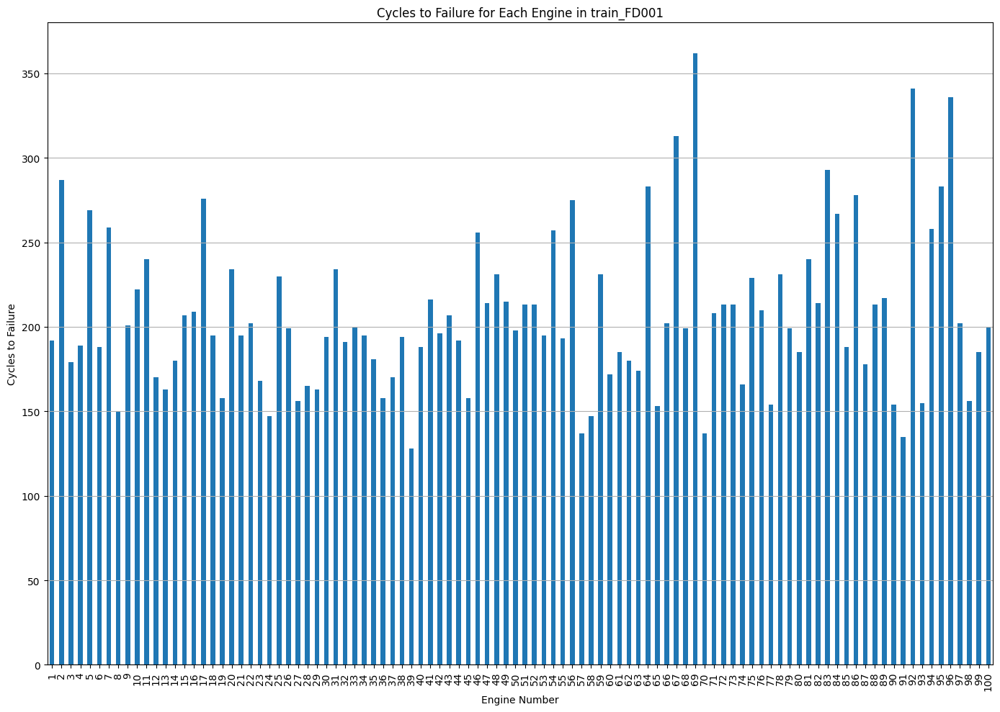

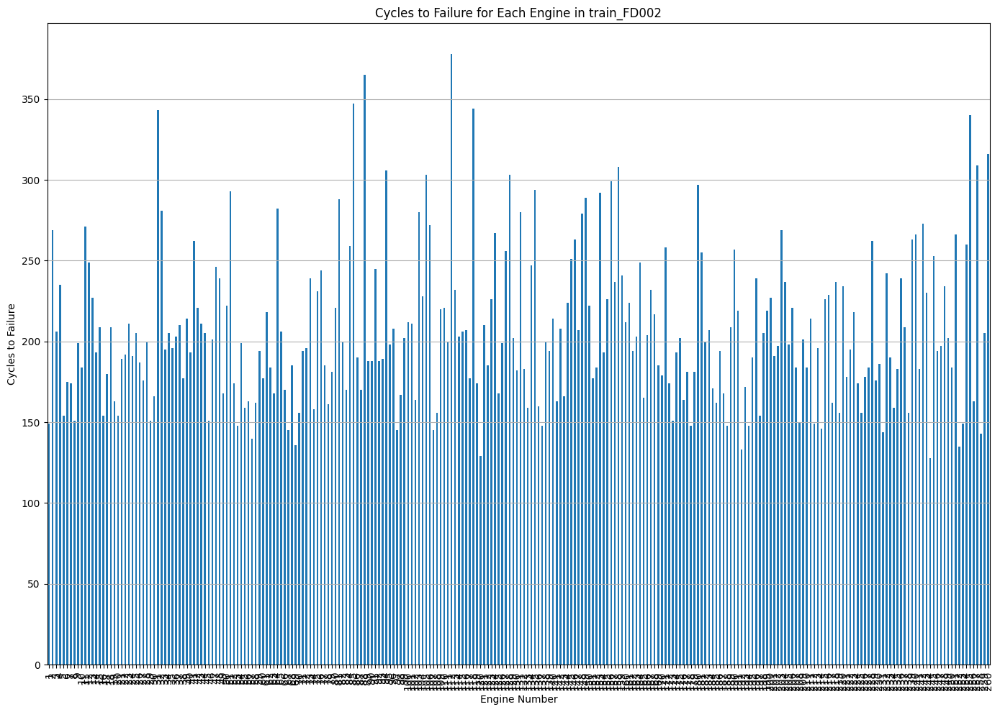

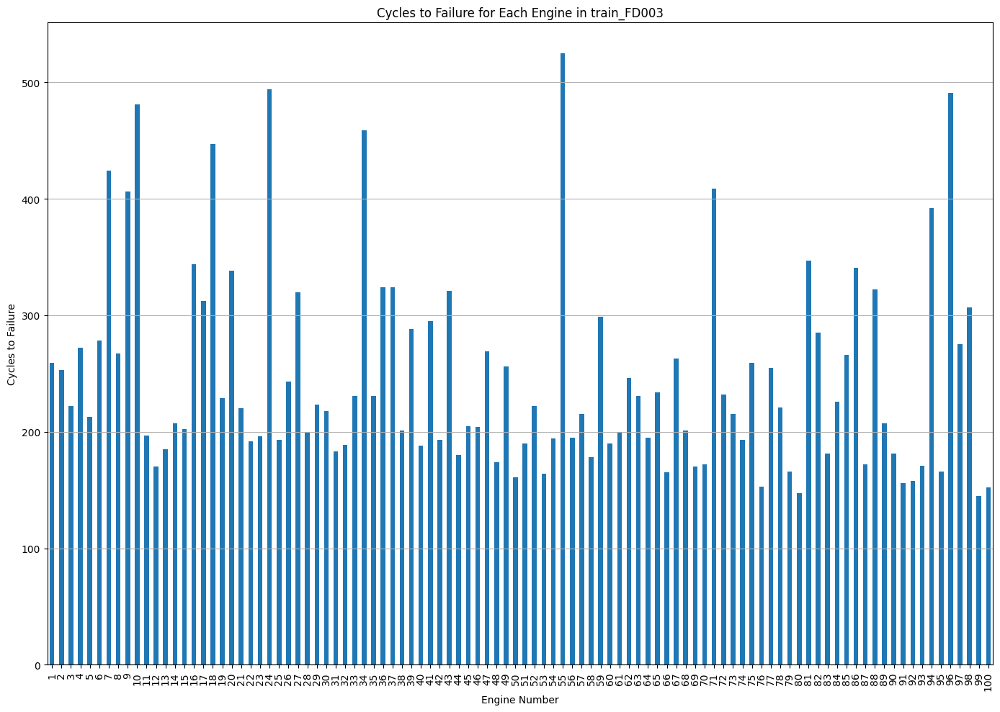

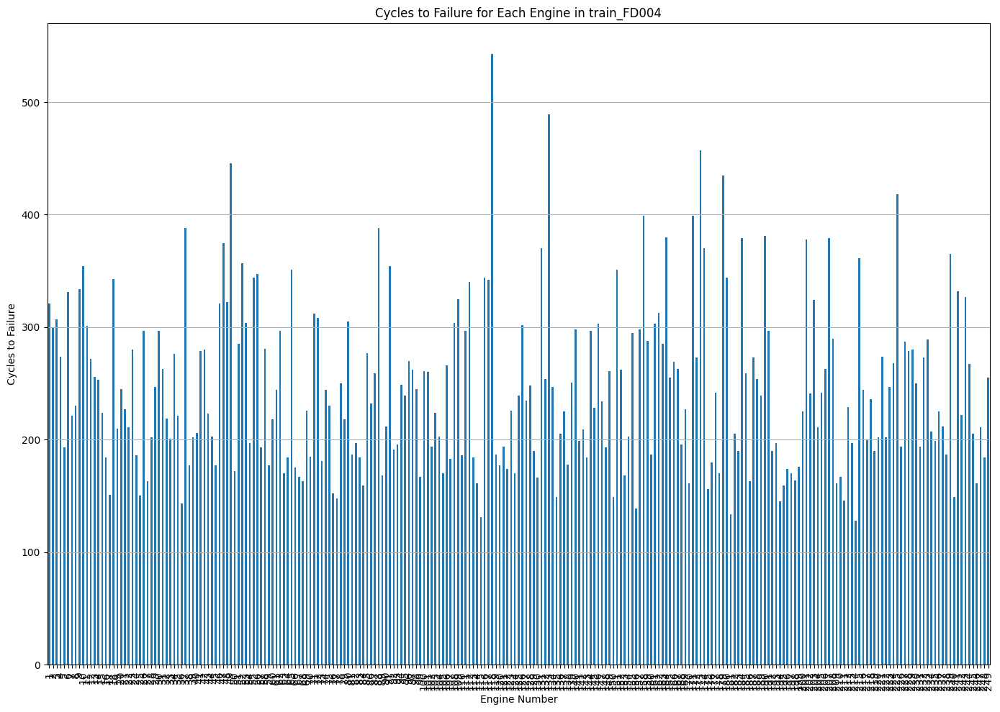

In [7]:
# Add "RUL" column and plot cycles to failure for each engine
for key, df in train_df.items():
    # Calculate the RUL for each entry
    df['RUL'] = df.groupby('EngineID')['Cycle'].transform('max') - df['Cycle']
    
    failure_data = df.loc[df.groupby('EngineID')['Cycle'].idxmax()]

    # Plot life of each engine
    plt.figure(figsize=(14, 10))
    failure_data.set_index('EngineID')['Cycle'].plot(kind='bar')
    plt.title(f'Cycles to Failure for Each Engine in {key}')
    plt.xlabel('Engine Number')
    plt.ylabel('Cycles to Failure')
    plt.xticks(rotation=90)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


In [8]:
print(train_df["train_FD001"].columns)

Index(['EngineID', 'Cycle', 'Op1', 'Op2', 'Op3', 'Sensor1', 'Sensor2',
       'Sensor3', 'Sensor4', 'Sensor5', 'Sensor6', 'Sensor7', 'Sensor8',
       'Sensor9', 'Sensor10', 'Sensor11', 'Sensor12', 'Sensor13', 'Sensor14',
       'Sensor15', 'Sensor16', 'Sensor17', 'Sensor18', 'Sensor19', 'Sensor20',
       'Sensor21', 'RUL'],
      dtype='object')


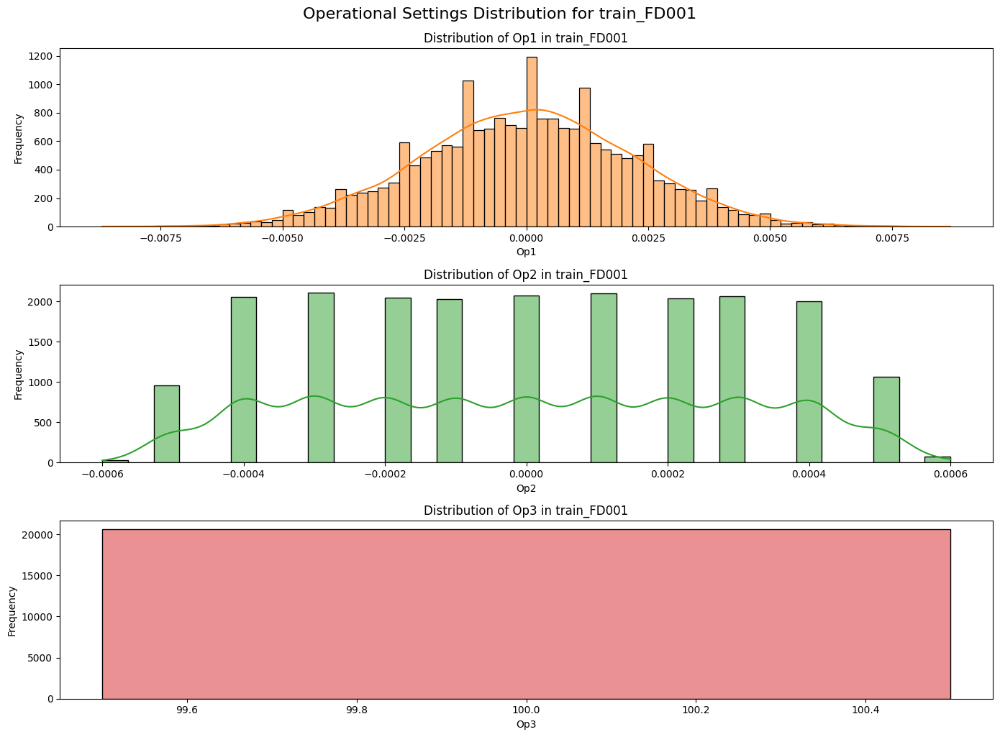

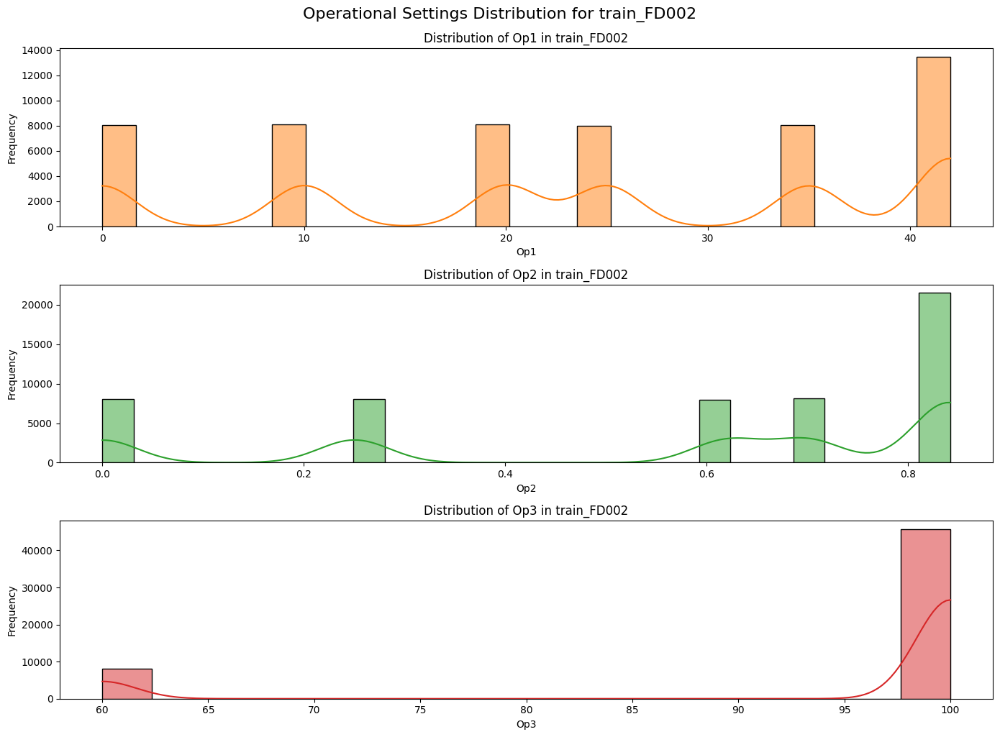

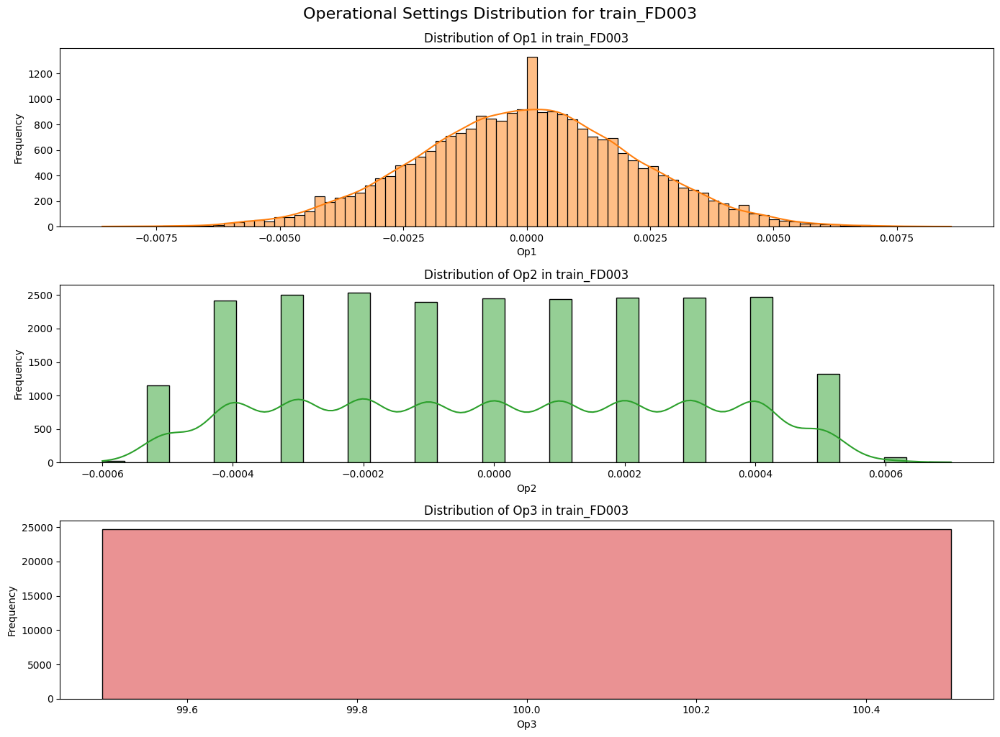

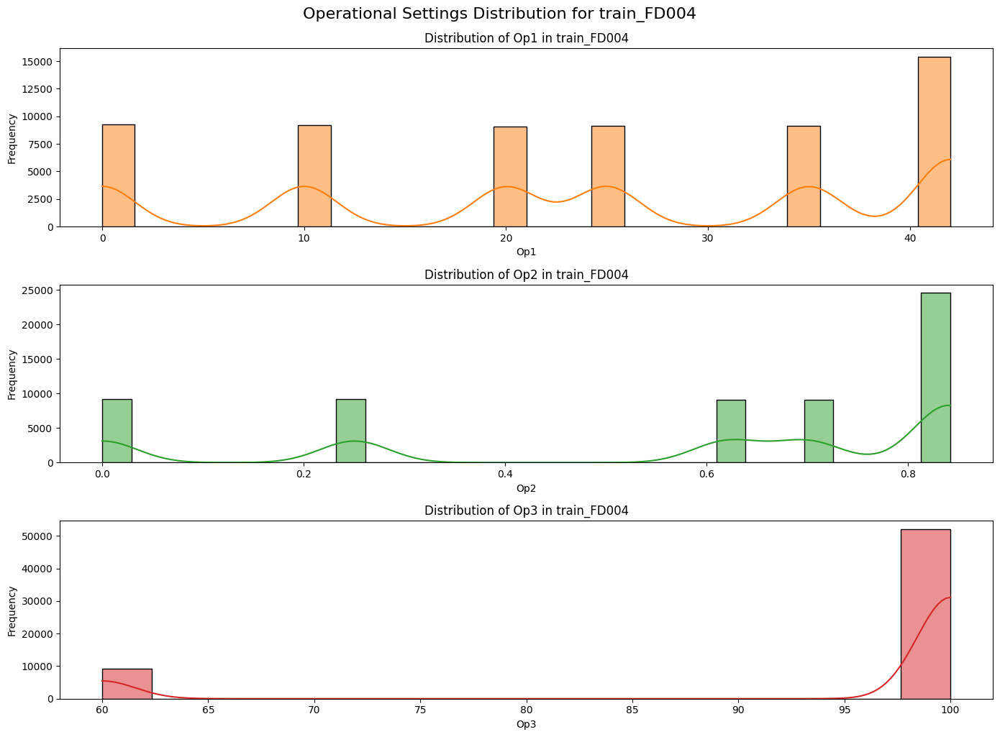

In [ ]:
# Distribution of Ops
for key, df in train_df.items():
    plt.figure(figsize=(14, 10))
    for i, op in enumerate(["Op1", "Op2", "Op3"], start=1):
        plt.subplot(3, 1, i)
        sns.histplot(df[op], kde=True, color=f"C{i}")
        plt.title(f"Distribution of {op} in {key}")
        plt.xlabel(op)
        plt.ylabel("Frequency")
    plt.tight_layout()
    plt.suptitle(f"Operational Settings Distribution for {key}", y=1.02, fontsize=16)
    plt.show()


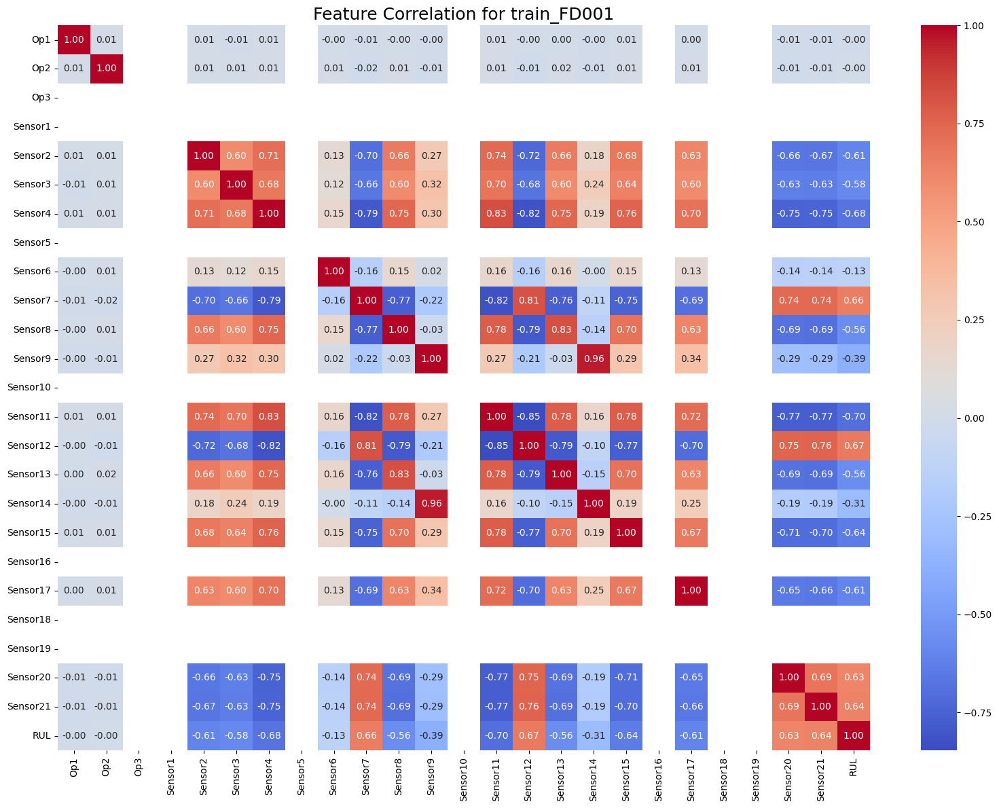

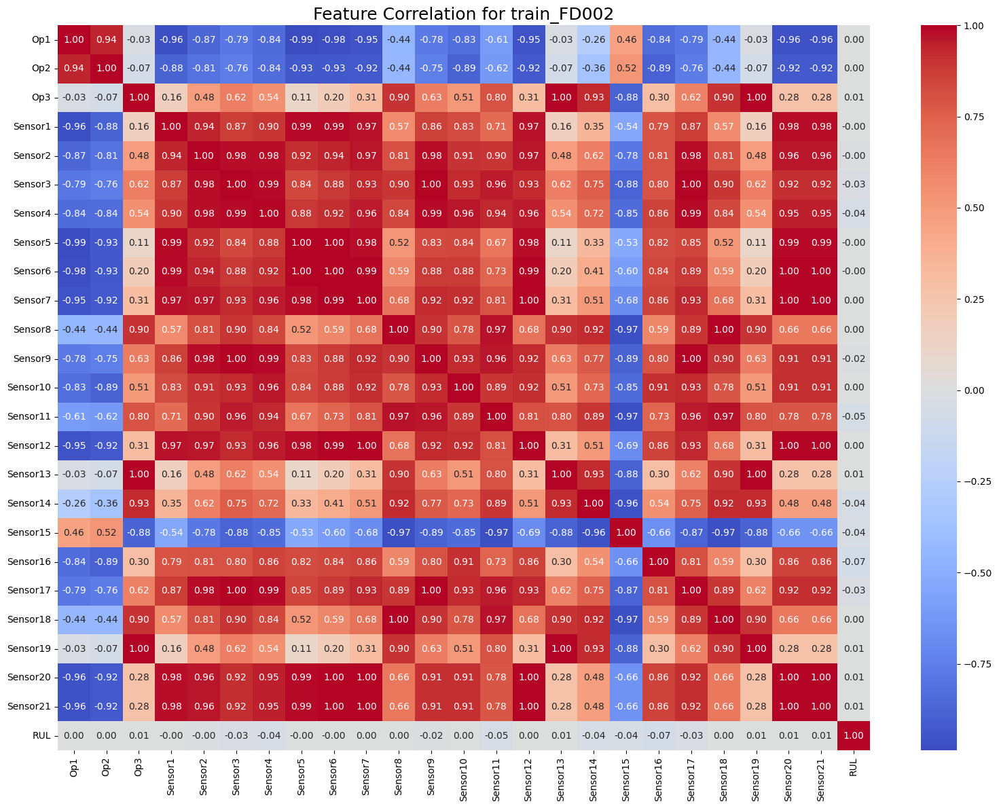

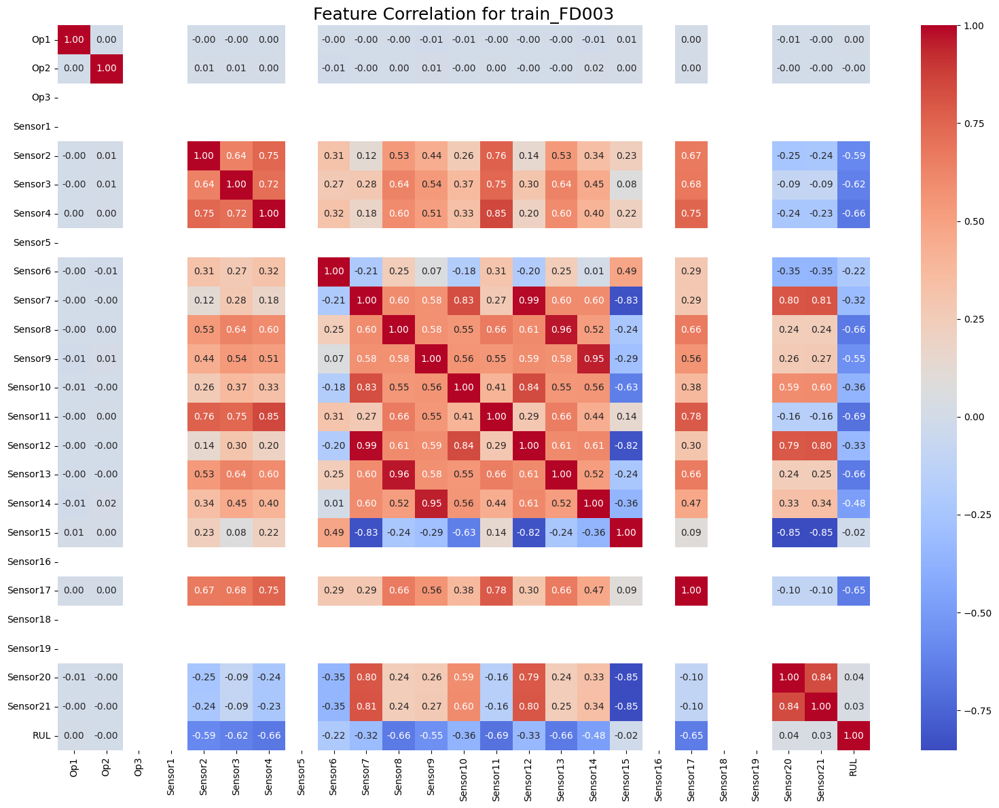

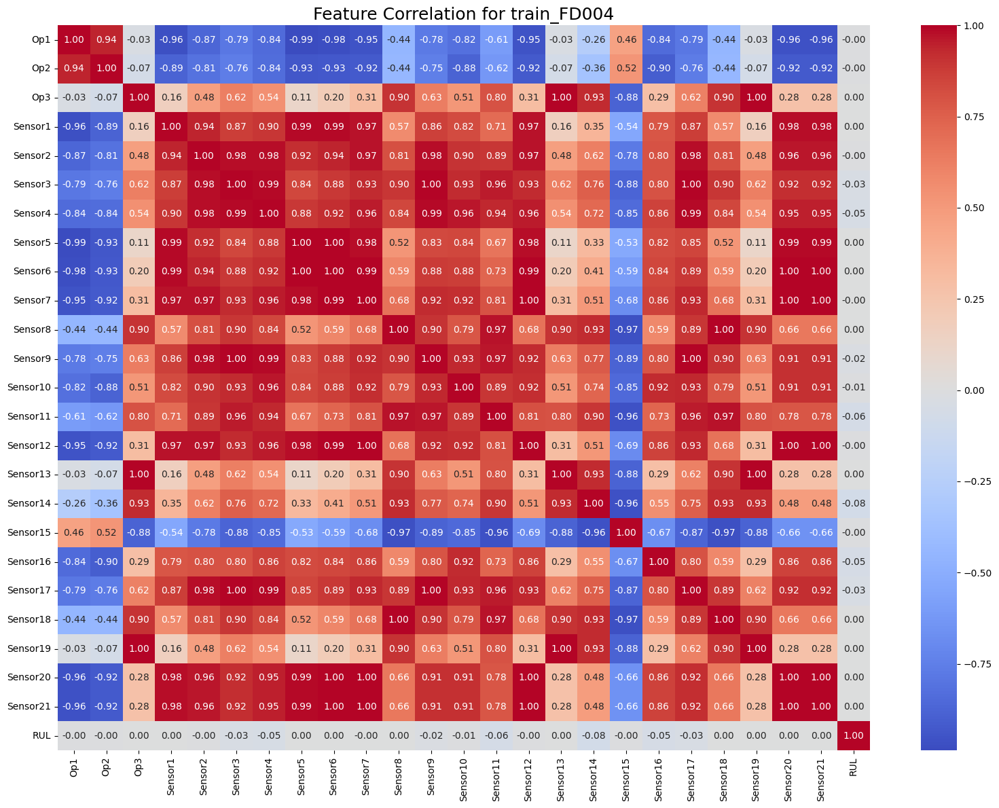

In [10]:
for key, df in train_df.items():
    plt.figure(figsize=(16, 12))
    
    # Calculate the correlation matrix, excluding non-numeric columns
    correlation_matrix = df.drop(columns=["EngineID", "Cycle"]).corr()
    
    # Create the heatmap
    sns.heatmap(
        correlation_matrix, 
        annot=True,
        fmt=".2f",
        cmap="coolwarm"
    )
    
    # Add title and adjust layout
    plt.title(f"Feature Correlation for {key}", fontsize=18)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()


### Very high correlation between the sensor values! Especially with 002 and 004 datasets!

Index(['Op1', 'Op2', 'Op3', 'Sensor1', 'Sensor2', 'Sensor3', 'Sensor4',
       'Sensor5', 'Sensor6', 'Sensor7', 'Sensor8', 'Sensor9', 'Sensor10',
       'Sensor11', 'Sensor12', 'Sensor13', 'Sensor14', 'Sensor15', 'Sensor16',
       'Sensor17', 'Sensor18', 'Sensor19', 'Sensor20', 'Sensor21', 'RUL'],
      dtype='object')


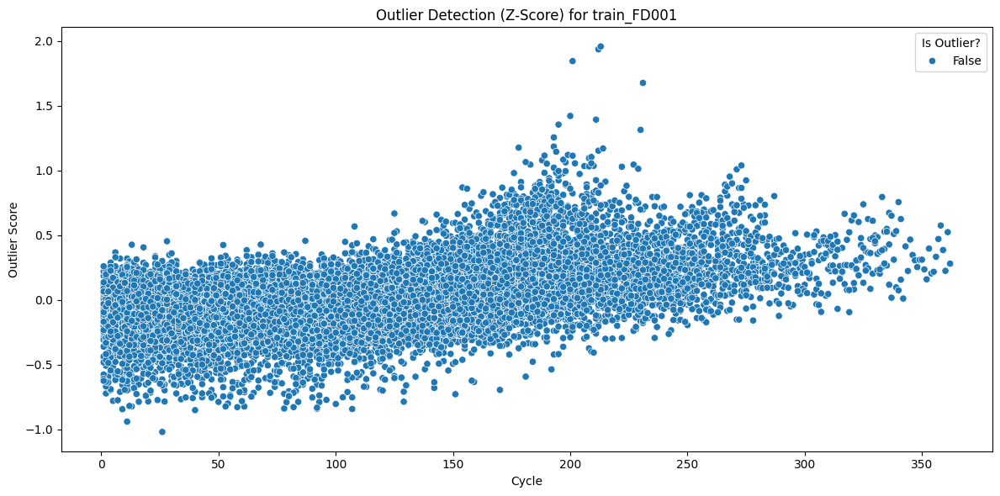

Dataset: train_FD001
Number of Outliers: 0
Index(['Op1', 'Op2', 'Op3', 'Sensor1', 'Sensor2', 'Sensor3', 'Sensor4',
       'Sensor5', 'Sensor6', 'Sensor7', 'Sensor8', 'Sensor9', 'Sensor10',
       'Sensor11', 'Sensor12', 'Sensor13', 'Sensor14', 'Sensor15', 'Sensor16',
       'Sensor17', 'Sensor18', 'Sensor19', 'Sensor20', 'Sensor21', 'RUL'],
      dtype='object')


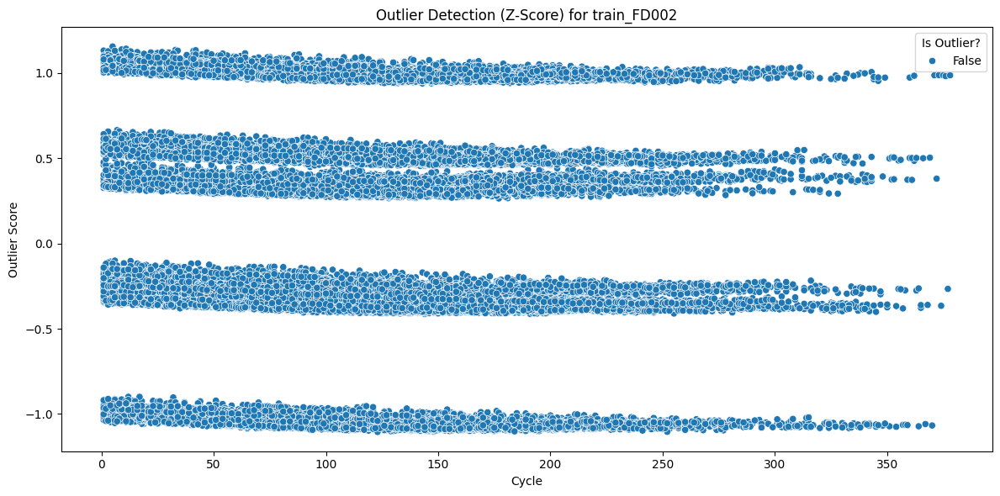

Dataset: train_FD002
Number of Outliers: 0
Index(['Op1', 'Op2', 'Op3', 'Sensor1', 'Sensor2', 'Sensor3', 'Sensor4',
       'Sensor5', 'Sensor6', 'Sensor7', 'Sensor8', 'Sensor9', 'Sensor10',
       'Sensor11', 'Sensor12', 'Sensor13', 'Sensor14', 'Sensor15', 'Sensor16',
       'Sensor17', 'Sensor18', 'Sensor19', 'Sensor20', 'Sensor21', 'RUL'],
      dtype='object')


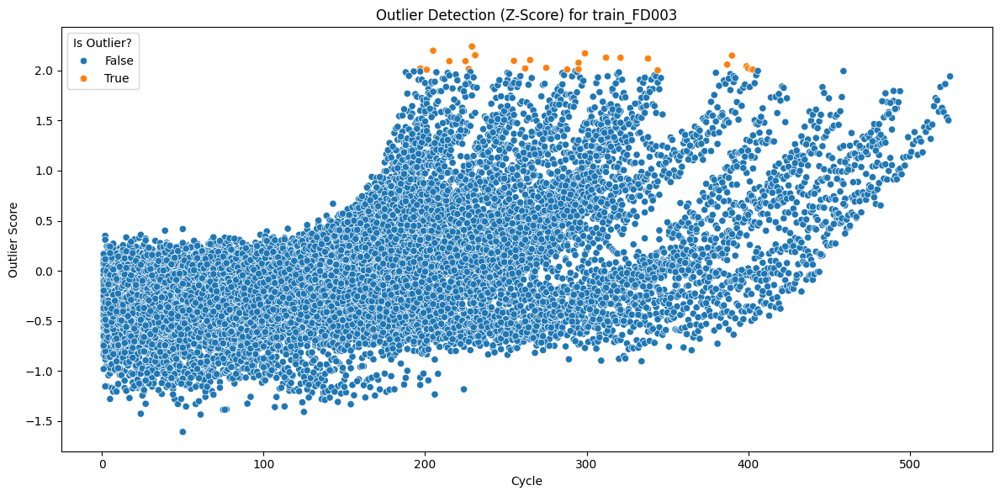

Dataset: train_FD003
Number of Outliers: 26
Index(['Op1', 'Op2', 'Op3', 'Sensor1', 'Sensor2', 'Sensor3', 'Sensor4',
       'Sensor5', 'Sensor6', 'Sensor7', 'Sensor8', 'Sensor9', 'Sensor10',
       'Sensor11', 'Sensor12', 'Sensor13', 'Sensor14', 'Sensor15', 'Sensor16',
       'Sensor17', 'Sensor18', 'Sensor19', 'Sensor20', 'Sensor21', 'RUL'],
      dtype='object')


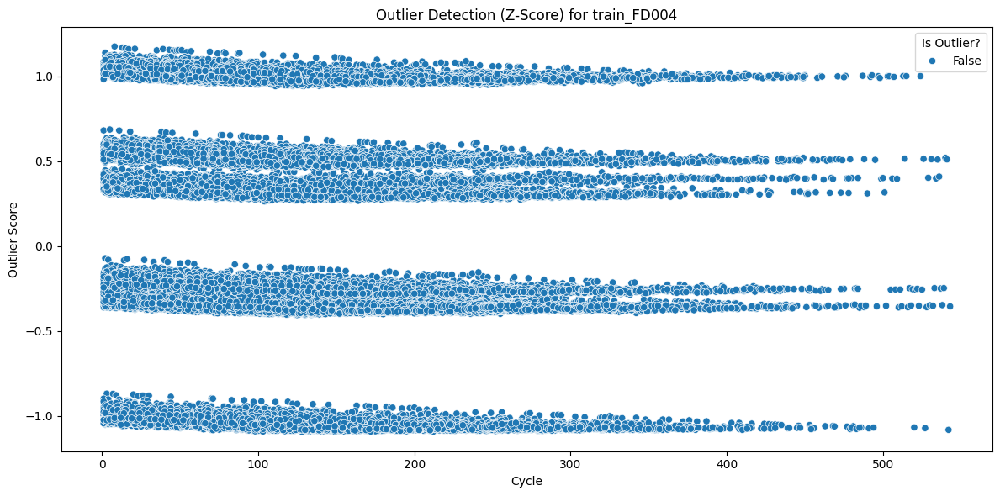

Dataset: train_FD004
Number of Outliers: 0


In [11]:
outlier_threshold = 2

# Iterate over all train datasets for outlier detection
for key, df in train_df.items():
    # Drop columns 'EngineID' and 'Cycle' and select only sensor columns
    sensor_cols = df.drop(columns=["EngineID", "Cycle"]).columns
    
    print(sensor_cols)
    # Calculate the Z-score and identify outliers
    df["Outlier_Score"] = df[sensor_cols].apply(zscore).mean(axis=1)
    outliers = df[df["Outlier_Score"] > outlier_threshold]
    
    # Plot the outlier scores
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=df, x="Cycle", y="Outlier_Score", hue=(df["Outlier_Score"] > outlier_threshold))
    plt.title(f"Outlier Detection (Z-Score) for {key}")
    plt.xlabel("Cycle")
    plt.ylabel("Outlier Score")
    plt.legend(title="Is Outlier?")
    plt.tight_layout()
    plt.show()
    
    # Print summary of outliers
    print(f"Dataset: {key}")
    print(f"Number of Outliers: {len(outliers)}")

Summary of Operational Conditions for train_FD001:
                Op1           Op2      Op3
count  20631.000000  20631.000000  20631.0
mean      -0.000009      0.000002    100.0
std        0.002187      0.000293      0.0
min       -0.008700     -0.000600    100.0
25%       -0.001500     -0.000200    100.0
50%        0.000000      0.000000    100.0
75%        0.001500      0.000300    100.0
max        0.008700      0.000600    100.0


Summary of Operational Conditions for train_FD002:
                Op1           Op2           Op3
count  53759.000000  53759.000000  53759.000000
mean      23.998407      0.572056     94.046020
std       14.747376      0.310016     14.237735
min        0.000000      0.000000     60.000000
25%       10.004600      0.250700    100.000000
50%       25.001300      0.700000    100.000000
75%       41.998000      0.840000    100.000000
max       42.008000      0.842000    100.000000


Summary of Operational Conditions for train_FD003:
                Op1     

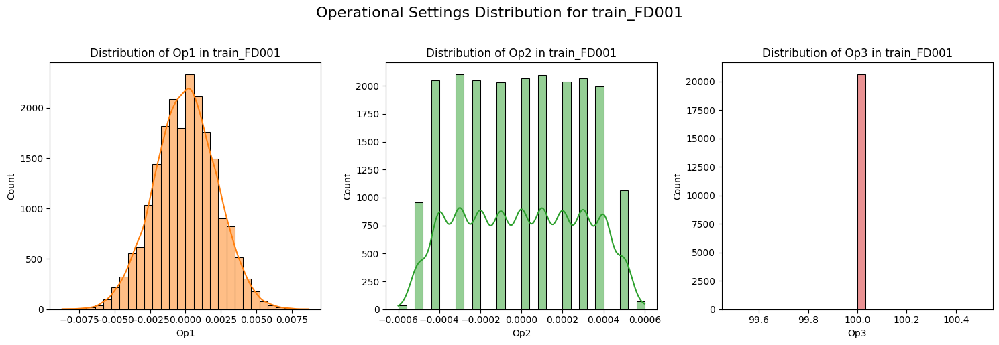

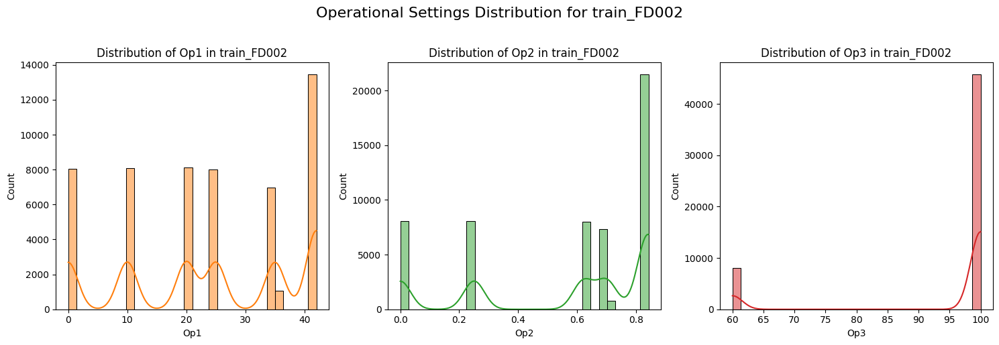

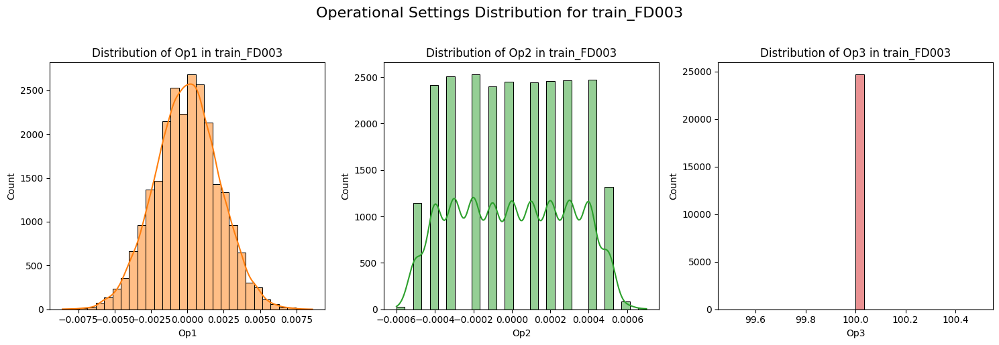

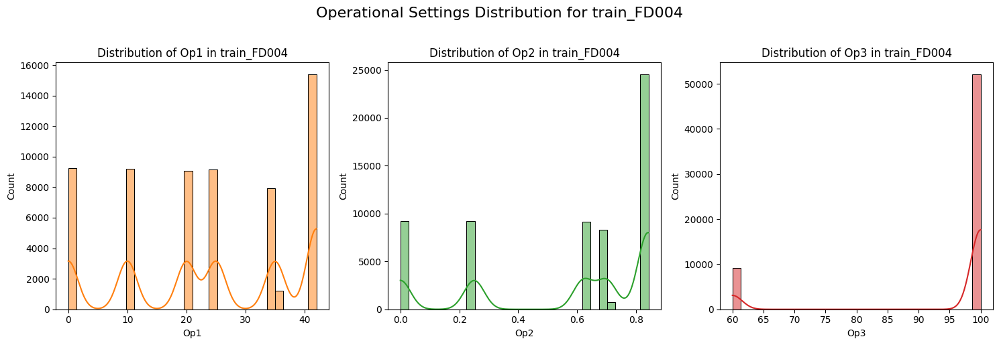

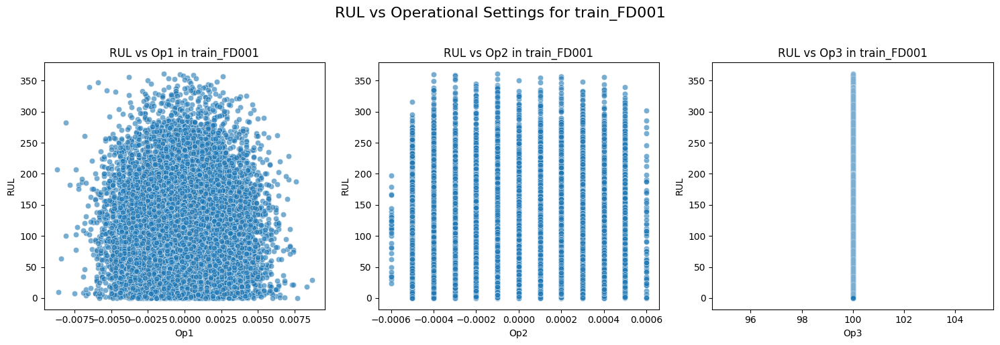

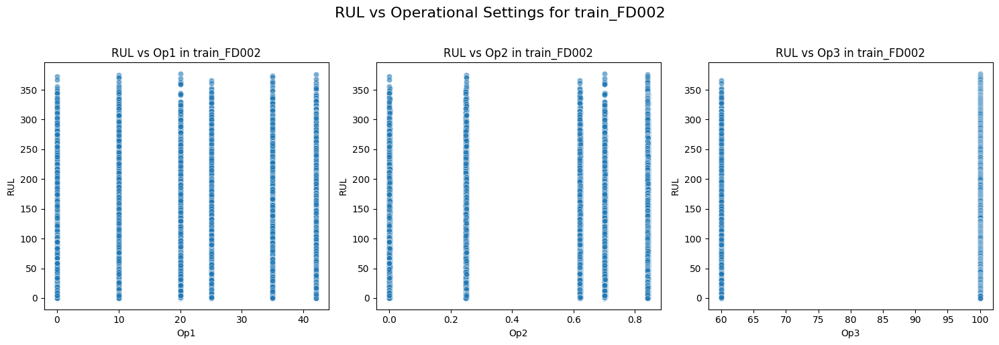

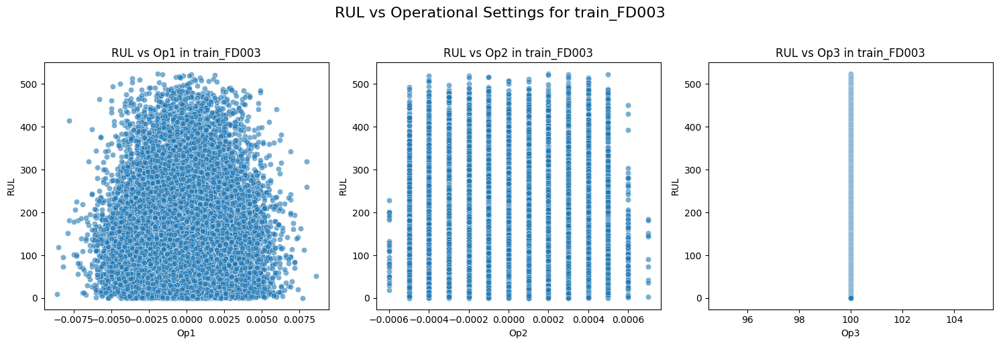

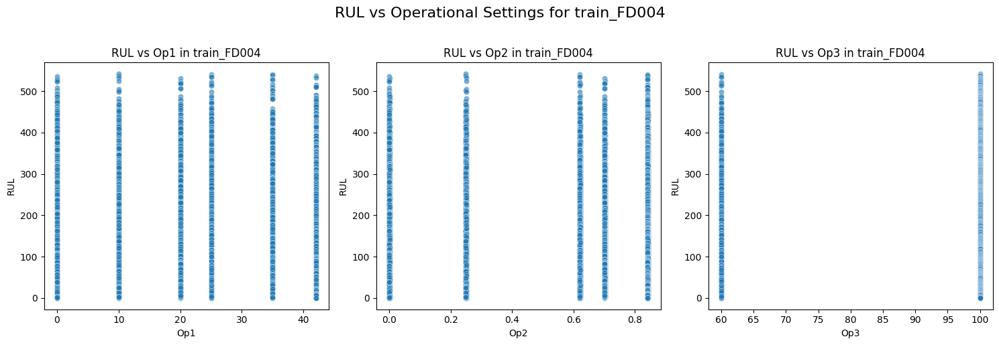

In [12]:
def summarize_operational_conditions(train_df):
    for key, df in train_df.items():
        print(f"Summary of Operational Conditions for {key}:")
        print(df[["Op1", "Op2", "Op3"]].describe())
        print("\n")

def plot_operational_distributions(train_df):
    for key, df in train_df.items():
        plt.figure(figsize=(15, 5))
        for i, op in enumerate(["Op1", "Op2", "Op3"], start=1):
            plt.subplot(1, 3, i)
            sns.histplot(data=df, x=op, kde=True, bins=30, color=f"C{i}")
            plt.title(f"Distribution of {op} in {key}")
        plt.suptitle(f"Operational Settings Distribution for {key}", y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()

def plot_rul_vs_operational_conditions(train_df):
    for key, df in train_df.items():
        plt.figure(figsize=(15, 5))
        for i, op in enumerate(["Op1", "Op2", "Op3"], start=1):
            plt.subplot(1, 3, i)
            sns.scatterplot(data=df, x=op, y="RUL", alpha=0.6)
            plt.title(f"RUL vs {op} in {key}")
        plt.suptitle(f"RUL vs Operational Settings for {key}", y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()

summarize_operational_conditions(train_df)
plot_operational_distributions(train_df)
plot_rul_vs_operational_conditions(train_df)


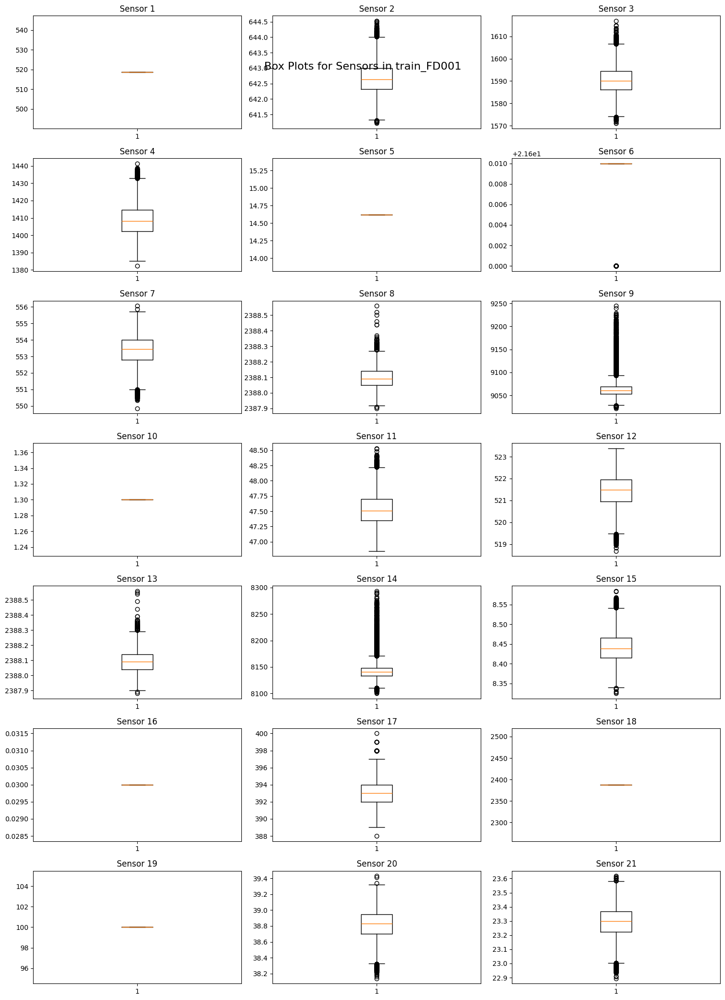

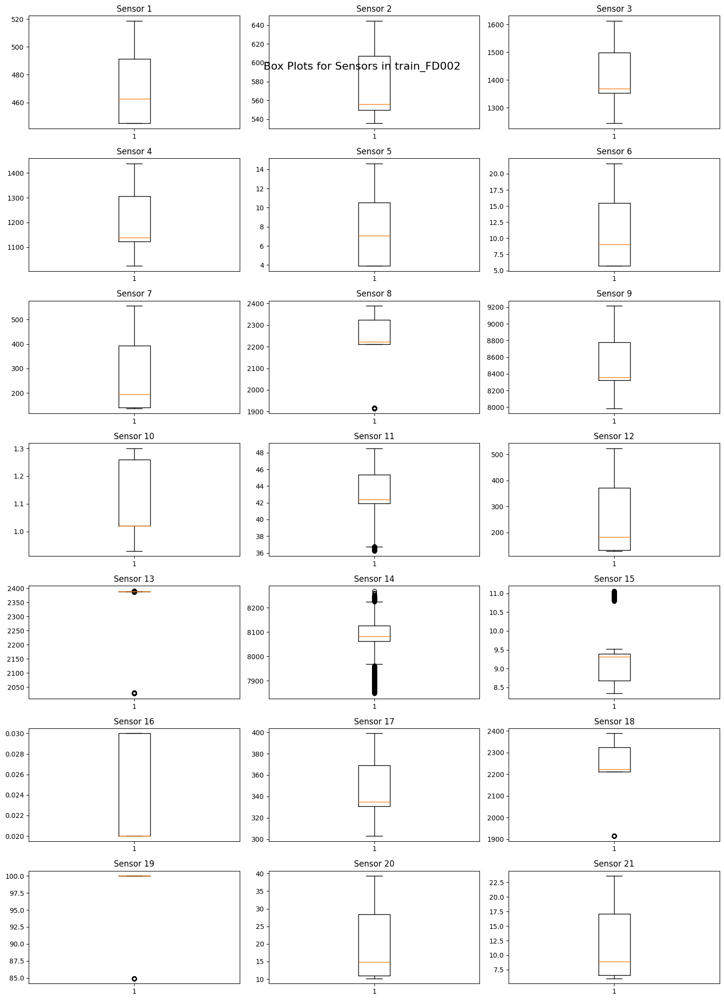

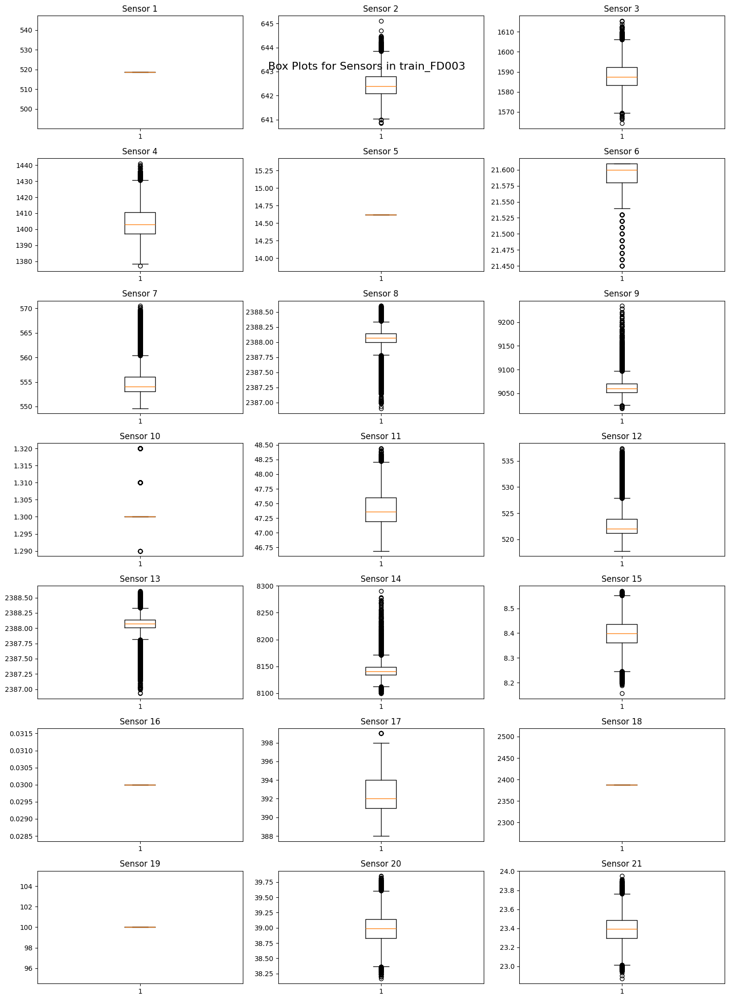

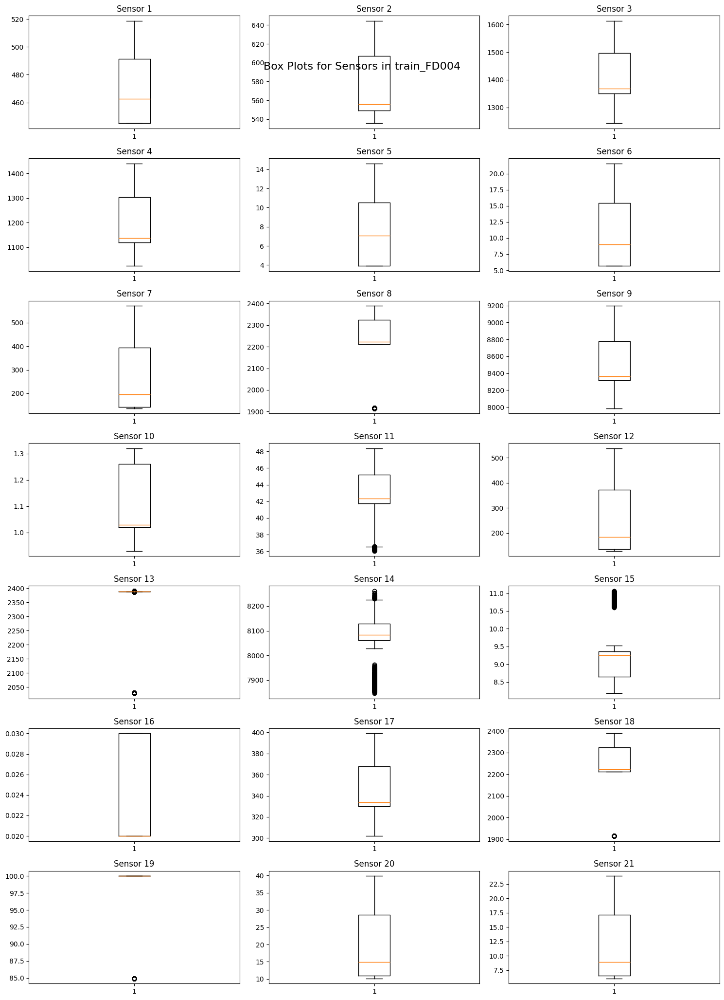

In [13]:
# Generate box plots for sensor data across all train datasets
for key, df in train_df.items():
    plt.figure(figsize=(15, 21))
    
    for i in np.arange(5, 26):  # Sensor1 starts at column 5
        temp = df.iloc[:, i]
        plt.subplot(7, 3, i - 4)
        plt.boxplot(temp)
        plt.title(f"Sensor {i - 4}")
    
    plt.suptitle(f"Box Plots for Sensors in {key}", y=0.92, fontsize=16)
    plt.tight_layout()
    plt.show()


#### Quite a high number of datapoints are outside the extremes! We also see a high number of constant sensor values across the training dataset!

#### Selecting Sensors 2, 3, 4, 7, 8, 9, 11, 12, 13, 14, 15, 17, 20, 21

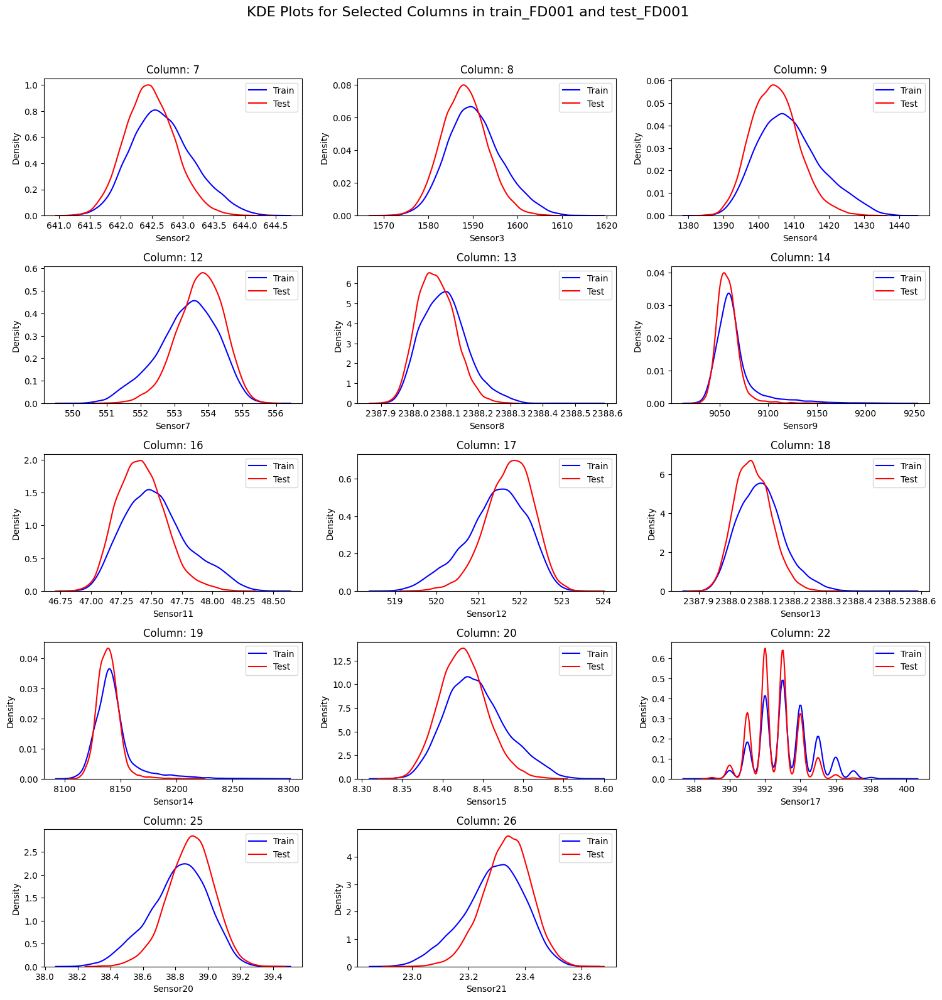

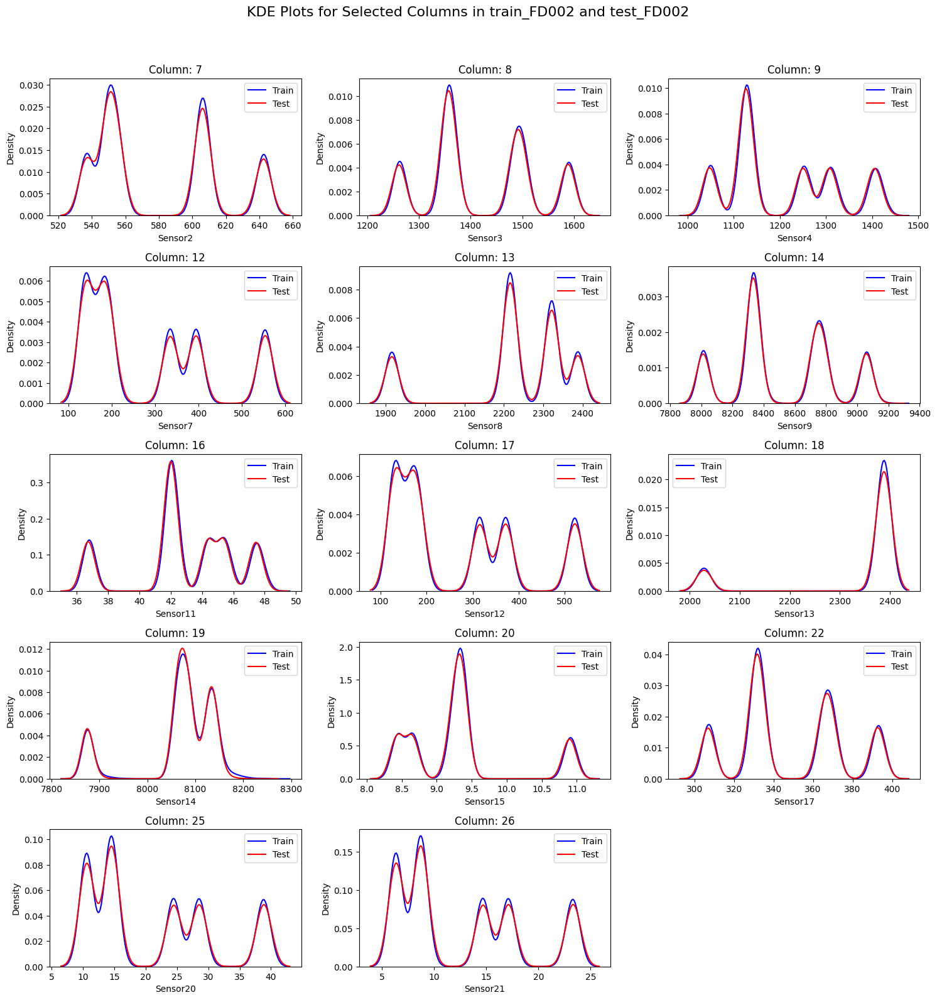

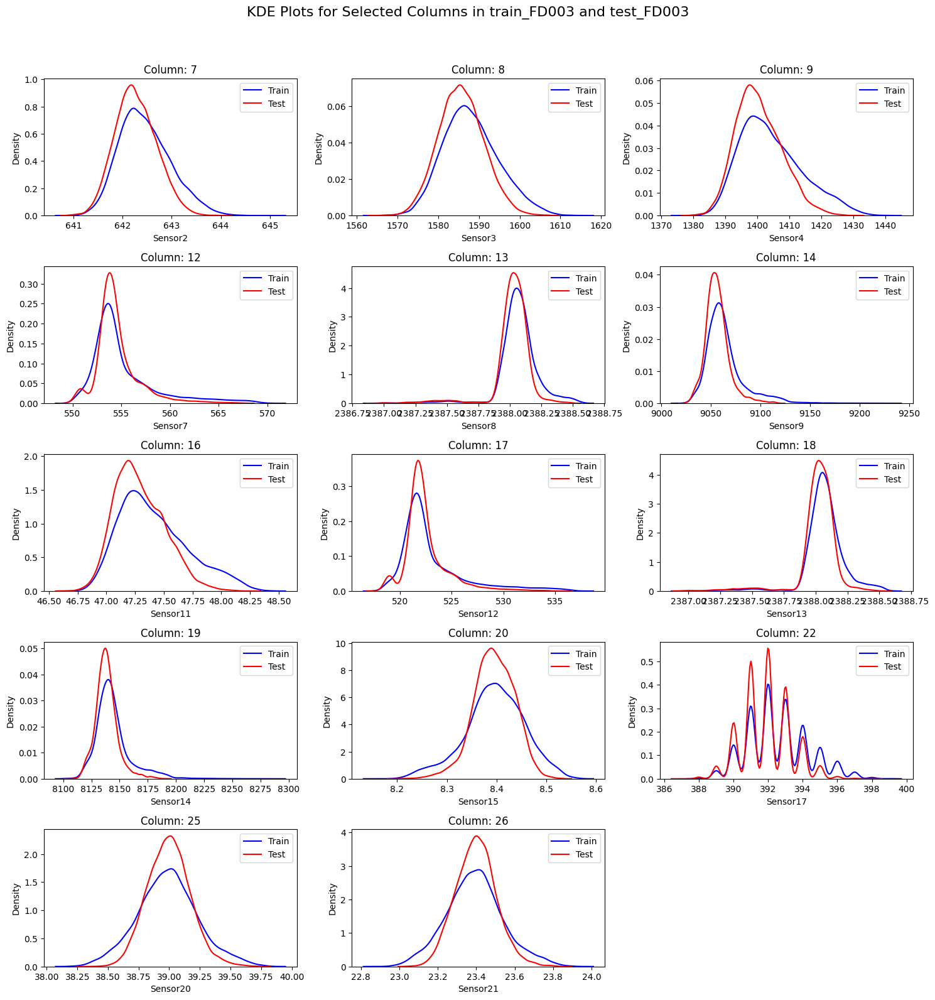

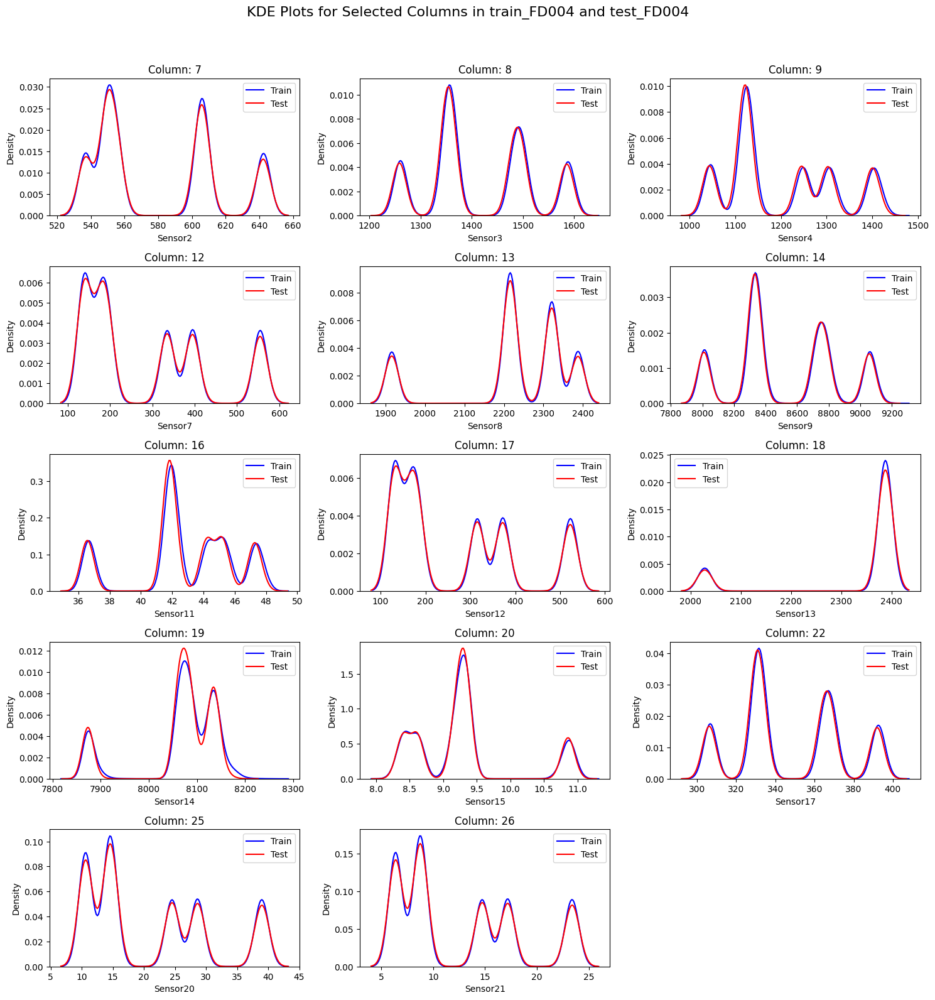

In [ ]:
# Note: 0-based indexing
selected_columns = [6, 7, 8, 11, 12, 13, 15, 16, 17, 18, 19, 21, 24, 25]

for train_key, train_df in train_df.items():
    test_key = train_key.replace("train", "test")
    if test_key in test_df:
        test_data = test_df[test_key]
        
        plt.figure(figsize=(15, 21))
        for i, col_idx in enumerate(selected_columns):
            temp_train = train_df.iloc[:, col_idx]
            temp_test = test_data.iloc[:, col_idx]
            
            plt.subplot(7, 3, i + 1)
            sns.kdeplot(temp_train, legend=False, color="blue", label="Train")
            sns.kdeplot(temp_test, legend=False, color="red", label="Test")
            plt.title(f"Column: {col_idx + 1}")
            plt.legend()
        
        plt.suptitle(f"KDE Plots for Selected Columns in {train_key} and {test_key}", y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()


#### The test and training data have good distribution

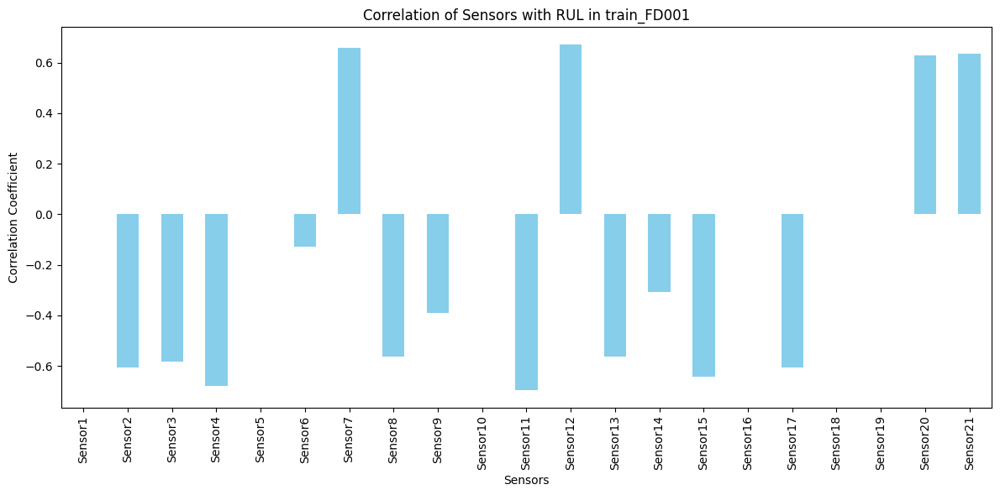

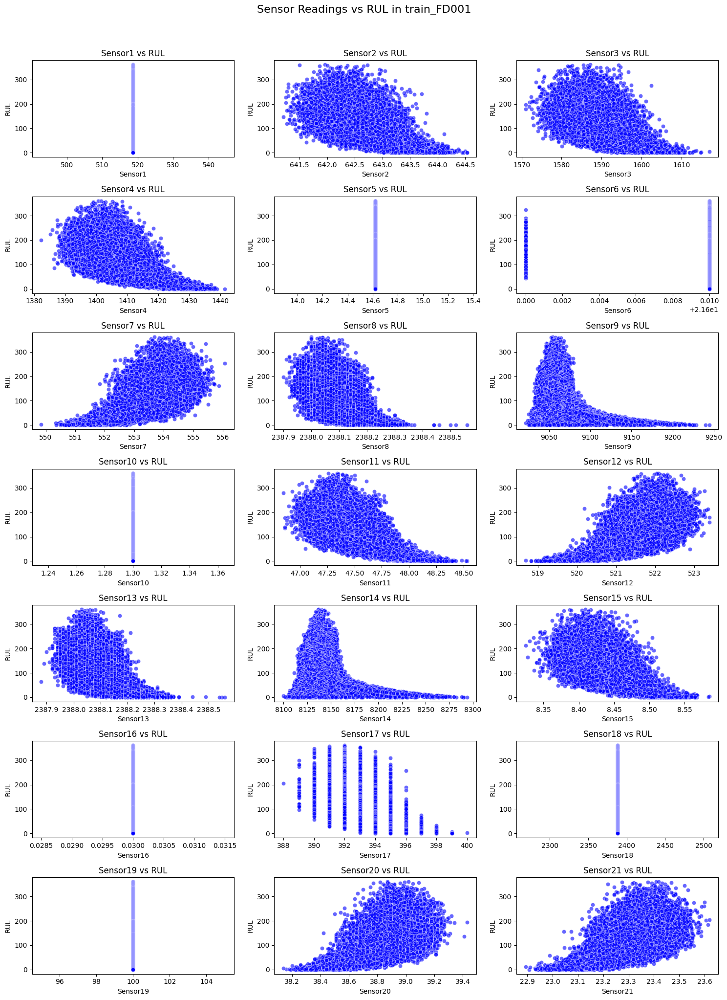

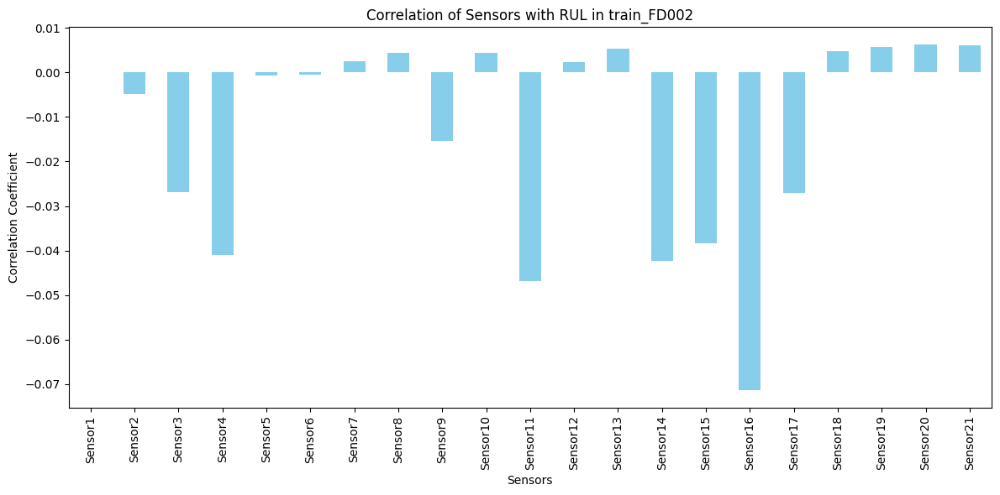

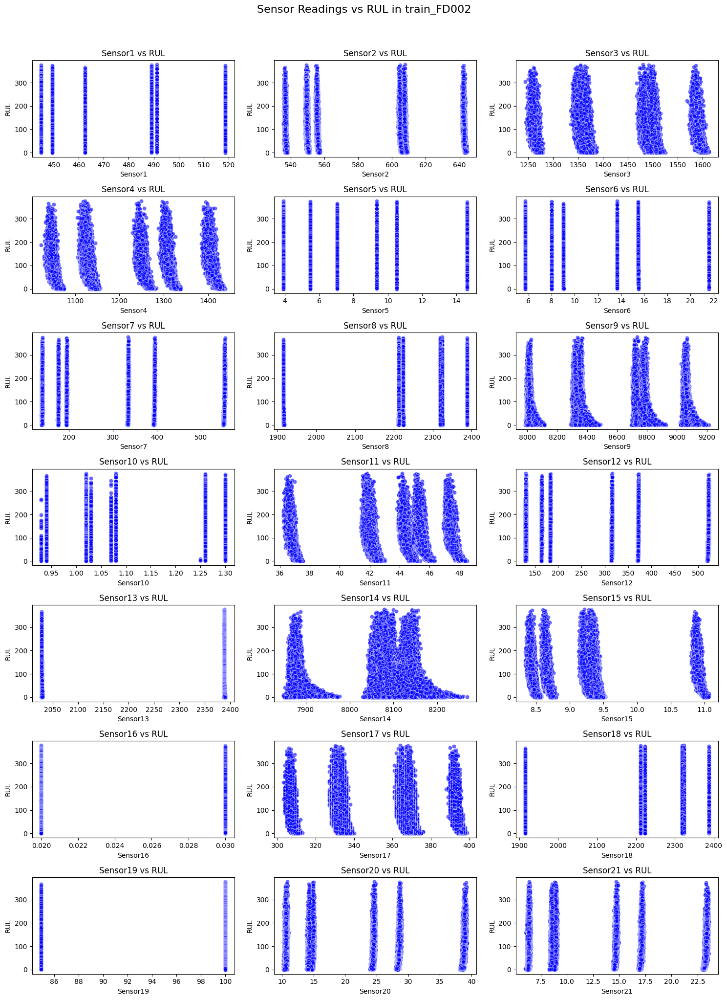

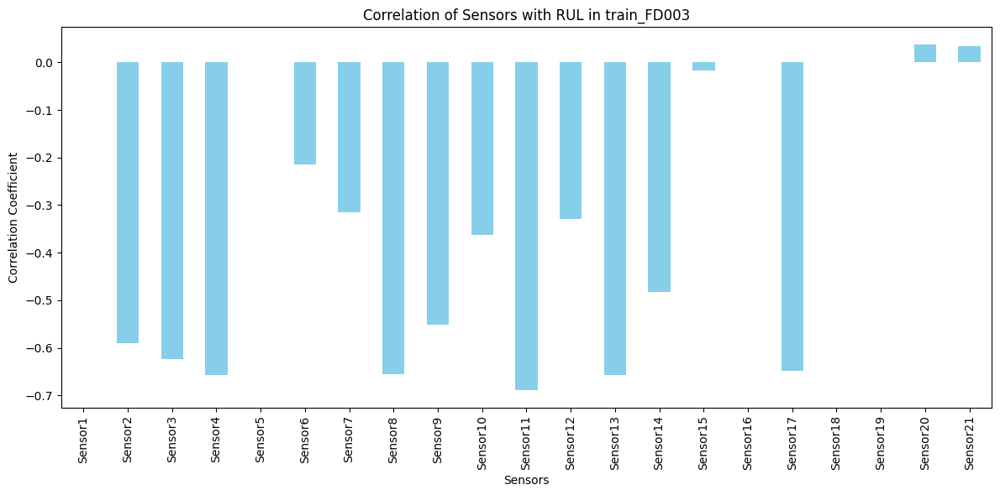

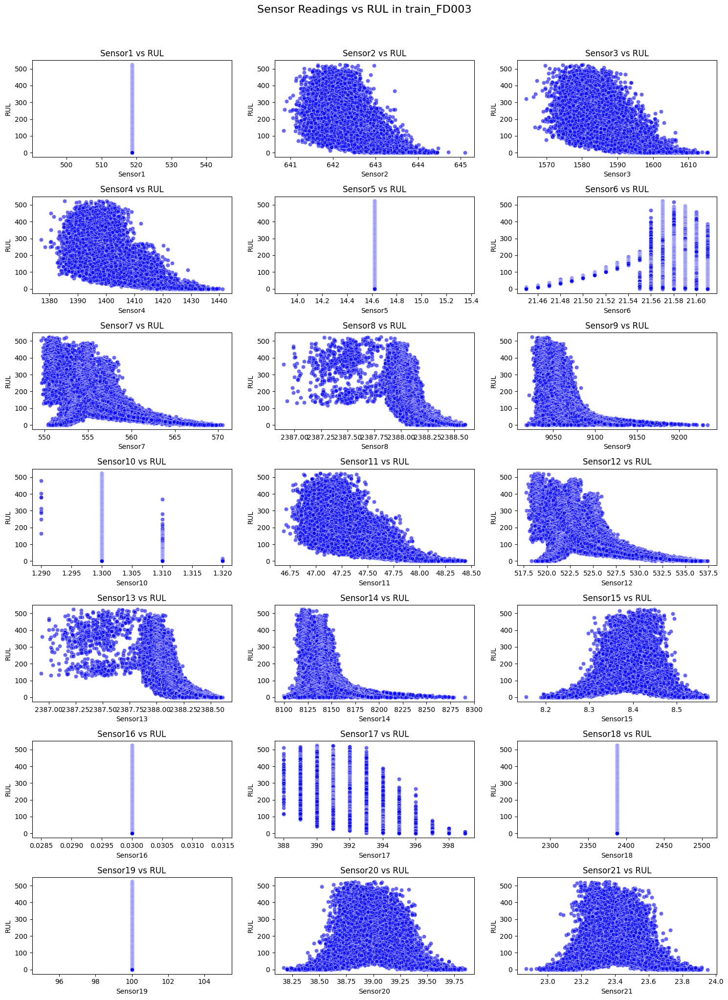

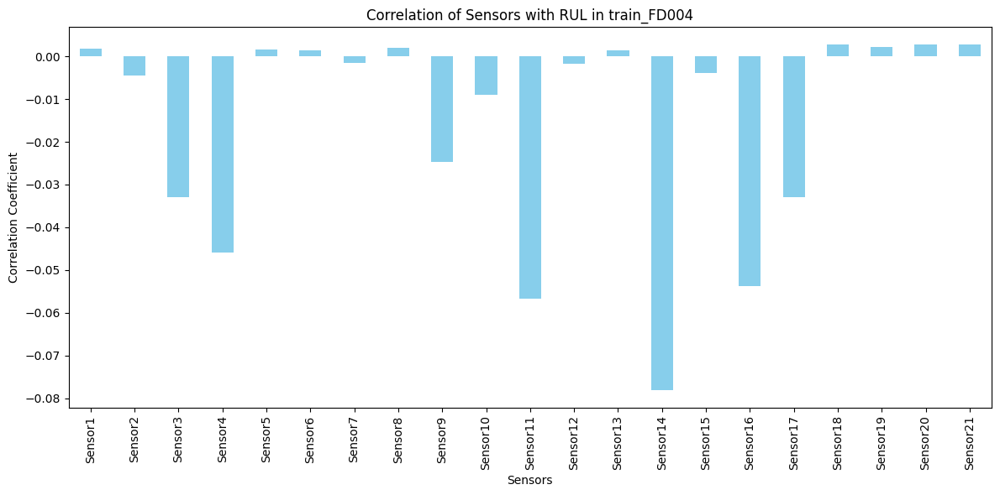

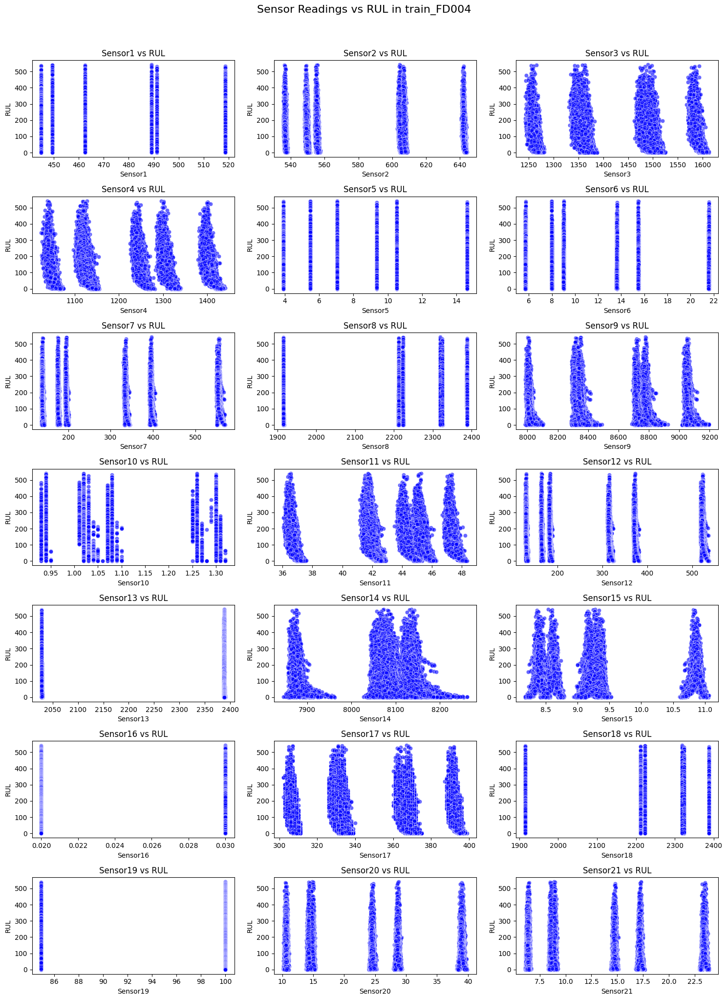

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot correlation of sensors with RUL
def plot_sensor_rul_correlation(train_df):
    for key, df in train_df.items():
        sensor_columns = [f"Sensor{i}" for i in range(1, 22)]  # Sensor1 to Sensor21
        correlations = df[sensor_columns + ["RUL"]].corr()["RUL"].iloc[:-1]  # Exclude RUL correlation with itself

        # Display correlations as a bar plot
        plt.figure(figsize=(12, 6))
        correlations.plot(kind='bar', color='skyblue')
        plt.title(f"Correlation of Sensors with RUL in {key}")
        plt.xlabel("Sensors")
        plt.ylabel("Correlation Coefficient")
        plt.tight_layout()
        plt.show()

        # Scatter plots for each sensor with RUL
        plt.figure(figsize=(15, 20))
        for i, sensor in enumerate(sensor_columns, start=1):
            plt.subplot(7, 3, i)
            sns.scatterplot(data=df, x=sensor, y="RUL", alpha=0.6, color='blue')
            plt.title(f"{sensor} vs RUL")
            plt.xlabel(sensor)
            plt.ylabel("RUL")
        plt.suptitle(f"Sensor Readings vs RUL in {key}", y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()

# Call the function
plot_sensor_rul_correlation(train_df)
